# DQN Agent for Doom

### Implementing a Deep Q Network with Replay Memory to play Doom.

This notebook presents the creation of a Deep Q Learning agent for playing a simplified version of Doom. I followed Thomas Simonini's tutorial : https://www.freecodecamp.org/news/an-introduction-to-deep-q-learning-lets-play-doom-54d02d8017d8/

Useful links:
- Code repo for the tutorial (using Tensorflow): https://github.com/simoninithomas/Deep_reinforcement_learning_Course
- Next part of the tutorial with improvements on the DQN: https://www.freecodecamp.org/news/improvements-in-deep-q-learning-dueling-double-dqn-prioritized-experience-replay-and-fixed-58b130cc5682/
- Doom game environment: http://vizdoom.cs.put.edu.pl/

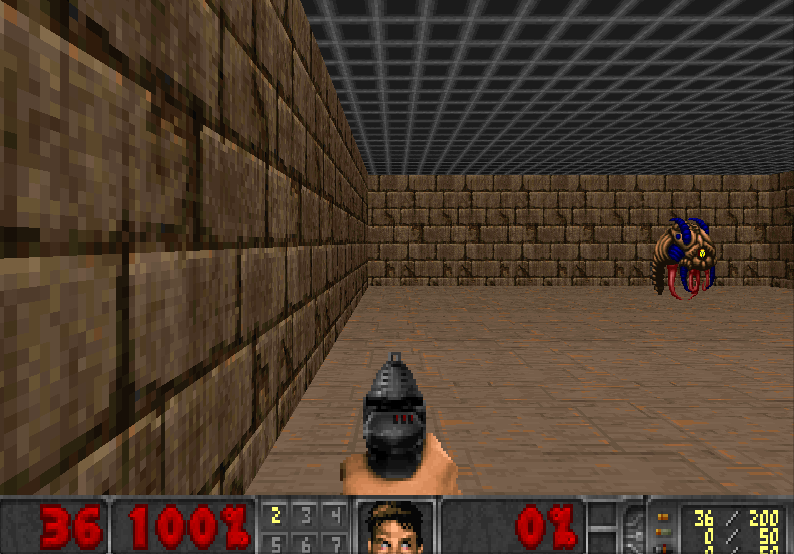

In [1]:
from IPython.display import Image
Image(filename="img/doom1.gif")

The environment contains a **shooter** and a **monster**. We control the shooter's action : move right or left, shoot. To do so, we have to use the image of the game given by the environment. 

The goal is to **navigate** in order to aim at the monster and **shoot** it. 

If the monster is shot, the episode ends and we get a **positive reward**. If we use all of the given ammo or can't kill the monster in a given time, the episode ends and we get a **negative reward**.


### Imports

In [2]:
import argparse
import random
import torch
import time

import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn.functional as F
import torch.nn as nn
import vizdoom as vzd
import numpy as np

from torch.autograd import Variable
from skimage import transform
from collections import deque
from PIL import Image

### Creating the Doom environment

In [3]:
class DoomEnv:
    
    def __init__(self):
        # Create the environment
        self.game_env = vzd.DoomGame()
        # Load the config
        self.game_env.load_config('config/basic.cfg')
        # Load the scenario
        self.game_env.set_doom_scenario_path('config/basic.wad')
        self.screen_size = (self.game_env.get_screen_width(), self.game_env.get_screen_height())
        # Create possible actions [left, right, shoot]
        self.actions = [[1, 0, 0],
                        [0, 1, 0],
                        [0, 0, 1]]
        # Number of tics we skip for each action
        self.skip_rate = 4
        
    def init(self):
        self.game_env.init()
        
    def new_episode(self):
        self.game_env.new_episode()
        
    def is_episode_finished(self):
        return self.game_env.is_episode_finished()
    
    def get_frame(self):
        game_state = self.game_env.get_state()
        return game_state.screen_buffer
    
    def make_action(self, action: int):
        return self.game_env.make_action(self.actions[action], self.skip_rate)
    
    def get_total_reward(self):
        return self.game_env.get_total_reward()
    
    def close(self):
        self.game_env.close()

### Preprocessing the image

For controlling the agent, we can simplify the image of the game environment. The goal is to preprocess the image in order to get rid of unnecessary information and keep only what's important to be able to control the agent. We also transform the given pixel values to fit in our DQN model.

We will then do four operations :
1. Grayscale the image as we don't need color information
2. Crop the frame to get rid of the ceiling and bottom HUD that are also not useful
3. Normalize the pixel values to be between 0 and 1
4. Resize the frame in order to fit the input layer of our DQN

In [4]:
def preprocess_frame(frame: np.ndarray) -> np.ndarray:
    # Grayscale the frame
    gray = np.mean(frame, 0)

    # Crop the frame
    cropped = gray[80:-33, 10:-10]

    # Normalise pixel values
    normed = cropped / 255.0

    # Resize
    resized = transform.resize(normed, [84, 84])

    return resized

Let's visualize the preprocessing operation:

Original game frame: (3, 240, 320)


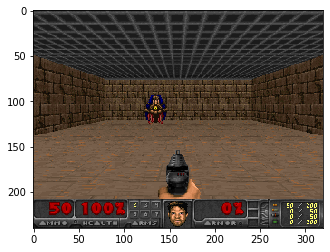

Preprocessed frame: (84, 84)


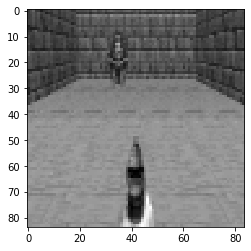

In [5]:
test_img = np.array(Image.open("img/doom_cap.png"))

print("Original game frame:", np.transpose(test_img, (2, 0, 1)).shape)
plt.imshow(test_img)
plt.show()

test_img = np.transpose(test_img, (2, 0, 1))
test_preproc_img = preprocess_frame(test_img)

print("Preprocessed frame:", test_preproc_img.shape)
plt.imshow(test_preproc_img, cmap='gray')
plt.show()

### Deep Q Network

The model takes as input a stack of **4 preprocessed frames** of shape (4, 84, 84).

We have a **3 convolutional layers** to try to understand the picture of the game. Each convolutional layer is followed by a batch normalization operation and an ELU activation. Next we have **2 fully connected layers** with 3 output neurons corresponding to the predicted value of each action. 

In [6]:
class DQNetwork(nn.Module):

    def __init__(self):
        super(DQNetwork, self).__init__()
        """
            First Convolutional layer:
            Conv2d: Output Width = [(Input width - Kernel width + 2 * Padding) / Stride] + 1
                => [(84 - 8 + 0) / 2] + 1 = 39 => 39 x 39 x 32
            BatchNormalization
        """
        self.conv1 = nn.Conv2d(in_channels=4, out_channels=32, kernel_size=8, stride=2)
        self.batchnorm1 = nn.BatchNorm2d(num_features=32)

        """
            Second Convolutional layer:
            Conv2d: Output => [(38 - 4 + 0) / 2] + 1 = 18 => 18 x 18 x 64
            BatchNormalization
        """
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2)
        self.batchnorm2 = nn.BatchNorm2d(num_features=64)

        """
            Third Convolutional layer:
            Conv2d: Output => [(18 - 4 + 0) / 2] + 1 = 8 => 8 x 8 x 128
            BatchNormalization
        """
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2)
        self.batchnorm3 = nn.BatchNorm2d(num_features=128)

        """
            First Fully Connected layer:
            Input size = 8 x 8 x 128 = 8192
        """
        self.fc1 = nn.Linear(in_features=8192, out_features=512)

        """
            Second Fully Connected layer = Output Layer
        """
        self.out = nn.Linear(in_features=512, out_features=3)

    def forward(self, x):
        # First Convolutional layer with ELU activation
        x = F.elu(self.batchnorm1(self.conv1(x)))

        # Second Convolutional layer with ELU activation
        x = F.elu(self.batchnorm2(self.conv2(x)))

        # Third Convolutional layer with ELU activation
        x = F.elu(self.batchnorm3(self.conv3(x)))

        # Flatten the output of the convolution
        x = x.view(-1, 8192)

        # First Fully Connected layer with ELU activation
        x = F.elu(self.fc1(x))

        # Output with the second fully connected layer
        return self.out(x)

### Replay Memory

In [7]:
class ReplayMemory():

    def __init__(self, max_size=10000):
        self.buffer = deque(maxlen=max_size)

    def store(self, exp):
        self.buffer.append(exp)

    def sample(self, batch_size):
        buffer_size = len(self.buffer)

        if buffer_size < batch_size:
            batch_size = buffer_size
            print(f'Not enough experience stored, returning only {batch_size} experiences.')

        # Get random ids in the buffer
        ids = np.random.choice(buffer_size, size=batch_size, replace=False)

        return [self.buffer[i] for i in ids]

### DQN Agent

In [8]:
class DoomDQNAgent():

    def __init__(self, checkpoint_path=None, init_replay_mem=None, target_update=64, dqn_class=DQNetwork):
        # Deep Q Learning agent
        # Deep Q Network
        self.dqn = dqn_class().cuda()
        # Loss
        self.loss = nn.MSELoss()
        # Learning rate
        self.lr = 0.0008
        # Discount factor
        self.dr = 0.98
        # Optimizer
        self.optimizer = torch.optim.Adam(self.dqn.parameters(), lr=self.lr)
        # Target update for Fixed Q-targets and Double DQN
        self.target_update = target_update
        
        # Initialize the game environment
        self.doom_env = DoomEnv()

        # Replay Memory
        if init_replay_mem is None:
            self.memory = ReplayMemory()
        else:
            self.memory = init_replay_mem

        # Stack of 4 frames
        self.frame_deque = None

        # Historic of metrics
        self.hist_loss = []
        self.hist_reward = []

        # Epoch we're at
        self.epoch = 0

        # Load state dict model if wanted
        if checkpoint_path is not None:
            self.load_checkpoint(checkpoint_path)

        # Target Q-Network
        self.target_dqn = dqn_class().cuda()
        self.target_dqn.load_state_dict(self.dqn.state_dict())
        
    def load_checkpoint(self, checkpoint_path: str):
        print("Loading checkpoint from", checkpoint_path)
        checkpoint = torch.load(checkpoint_path)
        self.epoch = checkpoint['epoch']
        self.dqn.load_state_dict(checkpoint['dqn_state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        self.hist_loss = checkpoint['hist_loss']
        self.hist_reward = checkpoint['hist_reward']
        
    def save_checkpoint(self, checkpoint_path: str):
        print("Saving checkpoint to", checkpoint_path)
        torch.save({
            'epoch': self.epoch,
            'dqn_state_dict': self.dqn.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'hist_loss': self.hist_loss,
            'hist_reward': self.hist_reward
        }, checkpoint_path)

    def stack_frame(self, frame):
        # If we start a new episode
        if self.frame_deque is None:
            # Stack the frame four times
            self.frame_deque = deque([frame, ] * 4, maxlen=4)
            for _ in range(4):
                self.frame_deque.append(frame)
        else:
            # Append the new frame to deque
            self.frame_deque.append(frame)

    def get_q_values(self, state, target=False):
        state = np.array(state)
        state = torch.from_numpy(state)
        if len(state.shape) == 3:
            state = state.unsqueeze(0)
        state = state.type(torch.FloatTensor).cuda()
        state = Variable(state)
        if not target:
            return self.dqn(state)
        else:
            return self.target_dqn(state)

    def choose_action(self, state, nb_epoch=None, i=None) -> int:
        # Compute Epsilon
        if nb_epoch is None:
            eps = 1
        else:
            eps = (i / nb_epoch) * 0.9

        # Perform Epsilon-Greedy Policy
        if random.random() > eps:
            # Perform Exploration
            a = random.randint(0, 2)
        else:
            # Perform Exploitation
            q_values = self.get_q_values(state)
            a = int(torch.argmax(q_values))

        return a

    def learning_step(self, batch_size):
        """ Perform a learning step using a batch from the replay memory. """
        batch = self.memory.sample(batch_size)
        if len(batch) < batch_size:
            print('Not enough samples to train, returning.')
            return None
        
        states_b = np.array([each[0] for each in batch], ndmin=3)
        actions_b = np.array([each[1] for each in batch])
        rewards_b = np.array([each[2] for each in batch]) 
        new_states_b = np.array([each[3] for each in batch], ndmin=3)
        is_terminals_b = np.array([each[4] for each in batch])

        # Get Q-values of next states
        next_qs_b = self.get_q_values(new_states_b, target=True).data.cpu().numpy()

        # Initialize Q-targets as Q-values for the current state
        q_targets_b = self.get_q_values(states_b, target=True).data.cpu().numpy()

        for i in range(len(batch)):
            if not is_terminals_b[i]:
                # Q-target = Reward + discount * maxQ(new_state)
                # Get maximum Q-value for the next state
                q2 = np.max(next_qs_b[i])
                # Update to obtain Q-target
                id_action = actions_b[i]
                q_targets_b[i, id_action] = rewards_b[i] + self.dr * q2
            else:
                # Update to obtain Q-target
                id_action = actions_b[i]
                q_targets_b[i, id_action] = rewards_b[i]
            
        # Execute Learning step
        q_targets_b = Variable(torch.from_numpy(q_targets_b).cuda())
        outputs_b = self.get_q_values(states_b)
        loss = self.loss(outputs_b, q_targets_b)
        # Reinitialize gradients
        self.optimizer.zero_grad()
        # Compute gradients and update parameters
        loss.backward()
        self.optimizer.step()

        return float(torch.mean(loss))

    def run_train(self, nb_epoch=3000, batch_size=256, save_checkpoint=True):
        print(f"Starting training from epoch {self.epoch},")
        print(f"                  for {nb_epoch} episodes,")
        print(f"                  updating DQN to target network every {self.target_update} epochs,")
        print(f"                  with batch size {batch_size}.")
        
        self.doom_env.init()
        # Target update
        t_update = 0
        for i in range(self.epoch, self.epoch + nb_epoch):
            # Start new episode
            self.doom_env.new_episode()
            
            while not self.doom_env.is_episode_finished():
                # Get frame and preprocess it
                frame = self.doom_env.get_frame()
                preproc_frame = preprocess_frame(frame)

                # Stack the preprocessed frame
                self.stack_frame(preproc_frame)
                state = np.asarray(self.frame_deque)
                
                # Choose an action
                action = self.choose_action(state, nb_epoch, i + 1)
                
                # Make action and get reward
                reward = self.doom_env.make_action(action)

                # Get new state
                if not self.doom_env.is_episode_finished():
                    new_state_frame = preprocess_frame(self.doom_env.get_frame())
                    self.stack_frame(new_state_frame)
                    new_state = np.asarray(self.frame_deque)
                    is_terminal = False
                else:
                    new_state = np.zeros((4, 84, 84))
                    is_terminal = True
                
                # Store experience in Replay memory
                self.memory.store((state, action, reward, new_state, is_terminal))

            # Perform learning step
            loss = self.learning_step(batch_size)

            # Update target network if tau is reached
            t_update += 1
            if t_update == self.target_update:
                print("\nUpdating DQN to target network.\n")
                t_update = 0
                self.target_dqn.load_state_dict(self.dqn.state_dict())

            # Add hist data
            if loss:
                self.hist_loss.append(loss)
            self.hist_reward.append(self.doom_env.get_total_reward())
            print (f"Ep #{i + 1} Result:", self.hist_reward[-1])
            
        self.doom_env.close()
        self.epoch = i + 1

        # Save checkpoint
        if save_checkpoint:
            checkpoint_path = f"checkpoint/doom_dqn_e{self.epoch}_{int(time.time())}.pth"
            self.save_checkpoint(checkpoint_path)

### Visualize training curves

In [9]:
def compute_mov_avg(data: list, window=10):
    ids = [window * x for x in range(0, int(len(data) / window) + 1)]
    if ids[-1] < len(data) - 1:
        ids.append(len(data) - 1)
    mov_avg = []
    for i in range(1, len(ids)):
        mov_avg.append(sum(data[ids[i - 1]:ids[i]]) / len(data[ids[i - 1]:ids[i]]))
    return ids[1:], mov_avg

def display_metrics(data: list, legend: str, mov_avg=True):
    plt.figure(figsize=(15,5))
    # Plot data
    plt.plot(np.arange(len(data)), data, label=legend)
    # Plot moving average
    if mov_avg:
        ids, avg = compute_mov_avg(data, 30)
        plt.plot(ids, avg, label=legend + ' average')
    plt.legend()
    plt.show()

### Training experiments

Training a simple DQN for 3000 epochs, with batch_size 256:

In [56]:
dqn_agent = DoomDQNAgent(target_update=1)

In [57]:
dqn_agent.run_train(nb_epoch=3000)

Starting training from epoch 0,
                  for 3000 episodes,
                  updating DQN to target network every 1 epochs,
                  with batch size 256.
Not enough experience stored, returning only 2 experiences.
Not enough samples to train, returning.

Updating DQN to target network.

Ep #1 Result: 95.0
Not enough experience stored, returning only 77 experiences.
Not enough samples to train, returning.

Updating DQN to target network.

Ep #2 Result: -370.0
Not enough experience stored, returning only 106 experiences.
Not enough samples to train, returning.

Updating DQN to target network.

Ep #3 Result: -33.0
Not enough experience stored, returning only 109 experiences.
Not enough samples to train, returning.

Updating DQN to target network.

Ep #4 Result: 91.0
Not enough experience stored, returning only 146 experiences.
Not enough samples to train, returning.

Updating DQN to target network.

Ep #5 Result: -71.0
Not enough experience stored, returning only 184 ex


Updating DQN to target network.

Ep #137 Result: -360.0

Updating DQN to target network.

Ep #138 Result: -365.0

Updating DQN to target network.

Ep #139 Result: -360.0

Updating DQN to target network.

Ep #140 Result: -375.0

Updating DQN to target network.

Ep #141 Result: -360.0

Updating DQN to target network.

Ep #142 Result: 1.0

Updating DQN to target network.

Ep #143 Result: 75.0

Updating DQN to target network.

Ep #144 Result: -365.0

Updating DQN to target network.

Ep #145 Result: -370.0

Updating DQN to target network.

Ep #146 Result: 71.0

Updating DQN to target network.

Ep #147 Result: -360.0

Updating DQN to target network.

Ep #148 Result: 91.0

Updating DQN to target network.

Ep #149 Result: 75.0

Updating DQN to target network.

Ep #150 Result: 95.0

Updating DQN to target network.

Ep #151 Result: -121.0

Updating DQN to target network.

Ep #152 Result: 51.0

Updating DQN to target network.

Ep #153 Result: 30.0

Updating DQN to target network.

Ep #154 Result


Ep #285 Result: 95.0

Updating DQN to target network.

Ep #286 Result: 22.0

Updating DQN to target network.

Ep #287 Result: 91.0

Updating DQN to target network.

Ep #288 Result: 91.0

Updating DQN to target network.

Ep #289 Result: 76.0

Updating DQN to target network.

Ep #290 Result: 87.0

Updating DQN to target network.

Ep #291 Result: -365.0

Updating DQN to target network.

Ep #292 Result: 91.0

Updating DQN to target network.

Ep #293 Result: 95.0

Updating DQN to target network.

Ep #294 Result: -365.0

Updating DQN to target network.

Ep #295 Result: 91.0

Updating DQN to target network.

Ep #296 Result: -365.0

Updating DQN to target network.

Ep #297 Result: -375.0

Updating DQN to target network.

Ep #298 Result: 64.0

Updating DQN to target network.

Ep #299 Result: 43.0

Updating DQN to target network.

Ep #300 Result: 95.0

Updating DQN to target network.

Ep #301 Result: 79.0

Updating DQN to target network.

Ep #302 Result: 95.0

Updating DQN to target network.

E


Updating DQN to target network.

Ep #434 Result: -370.0

Updating DQN to target network.

Ep #435 Result: -370.0

Updating DQN to target network.

Ep #436 Result: -57.0

Updating DQN to target network.

Ep #437 Result: -4.0

Updating DQN to target network.

Ep #438 Result: 9.0

Updating DQN to target network.

Ep #439 Result: -33.0

Updating DQN to target network.

Ep #440 Result: -50.0

Updating DQN to target network.

Ep #441 Result: 95.0

Updating DQN to target network.

Ep #442 Result: 95.0

Updating DQN to target network.

Ep #443 Result: 79.0

Updating DQN to target network.

Ep #444 Result: 54.0

Updating DQN to target network.

Ep #445 Result: -104.0

Updating DQN to target network.

Ep #446 Result: -44.0

Updating DQN to target network.

Ep #447 Result: 87.0

Updating DQN to target network.

Ep #448 Result: 95.0

Updating DQN to target network.

Ep #449 Result: 5.0

Updating DQN to target network.

Ep #450 Result: 95.0

Updating DQN to target network.

Ep #451 Result: -59.0




Updating DQN to target network.

Ep #582 Result: -360.0

Updating DQN to target network.

Ep #583 Result: -225.0

Updating DQN to target network.

Ep #584 Result: -161.0

Updating DQN to target network.

Ep #585 Result: -39.0

Updating DQN to target network.

Ep #586 Result: 63.0

Updating DQN to target network.

Ep #587 Result: -17.0

Updating DQN to target network.

Ep #588 Result: 43.0

Updating DQN to target network.

Ep #589 Result: -65.0

Updating DQN to target network.

Ep #590 Result: 95.0

Updating DQN to target network.

Ep #591 Result: -111.0

Updating DQN to target network.

Ep #592 Result: -112.0

Updating DQN to target network.

Ep #593 Result: 67.0

Updating DQN to target network.

Ep #594 Result: 66.0

Updating DQN to target network.

Ep #595 Result: 26.0

Updating DQN to target network.

Ep #596 Result: 95.0

Updating DQN to target network.

Ep #597 Result: 95.0

Updating DQN to target network.

Ep #598 Result: 95.0

Updating DQN to target network.

Ep #599 Result: 71


Updating DQN to target network.

Ep #731 Result: 58.0

Updating DQN to target network.

Ep #732 Result: 91.0

Updating DQN to target network.

Ep #733 Result: -101.0

Updating DQN to target network.

Ep #734 Result: 95.0

Updating DQN to target network.

Ep #735 Result: 87.0

Updating DQN to target network.

Ep #736 Result: 25.0

Updating DQN to target network.

Ep #737 Result: -33.0

Updating DQN to target network.

Ep #738 Result: -62.0

Updating DQN to target network.

Ep #739 Result: 68.0

Updating DQN to target network.

Ep #740 Result: -365.0

Updating DQN to target network.

Ep #741 Result: 87.0

Updating DQN to target network.

Ep #742 Result: -232.0

Updating DQN to target network.

Ep #743 Result: 83.0

Updating DQN to target network.

Ep #744 Result: 95.0

Updating DQN to target network.

Ep #745 Result: 28.0

Updating DQN to target network.

Ep #746 Result: -375.0

Updating DQN to target network.

Ep #747 Result: -29.0

Updating DQN to target network.

Ep #748 Result: 79.0


Updating DQN to target network.

Ep #880 Result: 95.0

Updating DQN to target network.

Ep #881 Result: 51.0

Updating DQN to target network.

Ep #882 Result: -104.0

Updating DQN to target network.

Ep #883 Result: 62.0

Updating DQN to target network.

Ep #884 Result: 43.0

Updating DQN to target network.

Ep #885 Result: 95.0

Updating DQN to target network.

Ep #886 Result: -16.0

Updating DQN to target network.

Ep #887 Result: 95.0

Updating DQN to target network.

Ep #888 Result: 33.0

Updating DQN to target network.

Ep #889 Result: 95.0

Updating DQN to target network.

Ep #890 Result: 95.0

Updating DQN to target network.

Ep #891 Result: 16.0

Updating DQN to target network.

Ep #892 Result: 87.0

Updating DQN to target network.

Ep #893 Result: 95.0

Updating DQN to target network.

Ep #894 Result: 63.0

Updating DQN to target network.

Ep #895 Result: 95.0

Updating DQN to target network.

Ep #896 Result: -8.0

Updating DQN to target network.

Ep #897 Result: -23.0

Updat


Updating DQN to target network.

Ep #1028 Result: 45.0

Updating DQN to target network.

Ep #1029 Result: 51.0

Updating DQN to target network.

Ep #1030 Result: 91.0

Updating DQN to target network.

Ep #1031 Result: 54.0

Updating DQN to target network.

Ep #1032 Result: 15.0

Updating DQN to target network.

Ep #1033 Result: 95.0

Updating DQN to target network.

Ep #1034 Result: 67.0

Updating DQN to target network.

Ep #1035 Result: 42.0

Updating DQN to target network.

Ep #1036 Result: 95.0

Updating DQN to target network.

Ep #1037 Result: 67.0

Updating DQN to target network.

Ep #1038 Result: -2.0

Updating DQN to target network.

Ep #1039 Result: -1.0

Updating DQN to target network.

Ep #1040 Result: 87.0

Updating DQN to target network.

Ep #1041 Result: 95.0

Updating DQN to target network.

Ep #1042 Result: 53.0

Updating DQN to target network.

Ep #1043 Result: 42.0

Updating DQN to target network.

Ep #1044 Result: 95.0

Updating DQN to target network.

Ep #1045 Resul


Updating DQN to target network.

Ep #1176 Result: 95.0

Updating DQN to target network.

Ep #1177 Result: 95.0

Updating DQN to target network.

Ep #1178 Result: 38.0

Updating DQN to target network.

Ep #1179 Result: 95.0

Updating DQN to target network.

Ep #1180 Result: 91.0

Updating DQN to target network.

Ep #1181 Result: 30.0

Updating DQN to target network.

Ep #1182 Result: 95.0

Updating DQN to target network.

Ep #1183 Result: 87.0

Updating DQN to target network.

Ep #1184 Result: -125.0

Updating DQN to target network.

Ep #1185 Result: 95.0

Updating DQN to target network.

Ep #1186 Result: 95.0

Updating DQN to target network.

Ep #1187 Result: -30.0

Updating DQN to target network.

Ep #1188 Result: 25.0

Updating DQN to target network.

Ep #1189 Result: 95.0

Updating DQN to target network.

Ep #1190 Result: 87.0

Updating DQN to target network.

Ep #1191 Result: -156.0

Updating DQN to target network.

Ep #1192 Result: 95.0

Updating DQN to target network.

Ep #1193 


Updating DQN to target network.

Ep #1322 Result: 50.0

Updating DQN to target network.

Ep #1323 Result: 95.0

Updating DQN to target network.

Ep #1324 Result: 67.0

Updating DQN to target network.

Ep #1325 Result: 52.0

Updating DQN to target network.

Ep #1326 Result: 95.0

Updating DQN to target network.

Ep #1327 Result: 95.0

Updating DQN to target network.

Ep #1328 Result: 95.0

Updating DQN to target network.

Ep #1329 Result: 95.0

Updating DQN to target network.

Ep #1330 Result: -30.0

Updating DQN to target network.

Ep #1331 Result: 66.0

Updating DQN to target network.

Ep #1332 Result: 95.0

Updating DQN to target network.

Ep #1333 Result: 76.0

Updating DQN to target network.

Ep #1334 Result: 95.0

Updating DQN to target network.

Ep #1335 Result: -365.0

Updating DQN to target network.

Ep #1336 Result: 91.0

Updating DQN to target network.

Ep #1337 Result: -17.0

Updating DQN to target network.

Ep #1338 Result: 50.0

Updating DQN to target network.

Ep #1339 R


Updating DQN to target network.

Ep #1469 Result: 72.0

Updating DQN to target network.

Ep #1470 Result: 95.0

Updating DQN to target network.

Ep #1471 Result: 20.0

Updating DQN to target network.

Ep #1472 Result: 95.0

Updating DQN to target network.

Ep #1473 Result: 70.0

Updating DQN to target network.

Ep #1474 Result: 95.0

Updating DQN to target network.

Ep #1475 Result: 26.0

Updating DQN to target network.

Ep #1476 Result: -62.0

Updating DQN to target network.

Ep #1477 Result: 95.0

Updating DQN to target network.

Ep #1478 Result: 87.0

Updating DQN to target network.

Ep #1479 Result: 47.0

Updating DQN to target network.

Ep #1480 Result: 75.0

Updating DQN to target network.

Ep #1481 Result: 87.0

Updating DQN to target network.

Ep #1482 Result: 23.0

Updating DQN to target network.

Ep #1483 Result: 64.0

Updating DQN to target network.

Ep #1484 Result: 33.0

Updating DQN to target network.

Ep #1485 Result: 76.0

Updating DQN to target network.

Ep #1486 Resu


Updating DQN to target network.

Ep #1616 Result: 68.0

Updating DQN to target network.

Ep #1617 Result: 91.0

Updating DQN to target network.

Ep #1618 Result: 91.0

Updating DQN to target network.

Ep #1619 Result: 58.0

Updating DQN to target network.

Ep #1620 Result: 72.0

Updating DQN to target network.

Ep #1621 Result: 95.0

Updating DQN to target network.

Ep #1622 Result: 95.0

Updating DQN to target network.

Ep #1623 Result: 13.0

Updating DQN to target network.

Ep #1624 Result: 95.0

Updating DQN to target network.

Ep #1625 Result: 72.0

Updating DQN to target network.

Ep #1626 Result: 75.0

Updating DQN to target network.

Ep #1627 Result: 24.0

Updating DQN to target network.

Ep #1628 Result: 95.0

Updating DQN to target network.

Ep #1629 Result: 71.0

Updating DQN to target network.

Ep #1630 Result: 95.0

Updating DQN to target network.

Ep #1631 Result: 91.0

Updating DQN to target network.

Ep #1632 Result: 95.0

Updating DQN to target network.

Ep #1633 Resul


Updating DQN to target network.

Ep #1764 Result: 95.0

Updating DQN to target network.

Ep #1765 Result: 95.0

Updating DQN to target network.

Ep #1766 Result: 34.0

Updating DQN to target network.

Ep #1767 Result: 58.0

Updating DQN to target network.

Ep #1768 Result: 19.0

Updating DQN to target network.

Ep #1769 Result: 95.0

Updating DQN to target network.

Ep #1770 Result: 95.0

Updating DQN to target network.

Ep #1771 Result: 95.0

Updating DQN to target network.

Ep #1772 Result: 95.0

Updating DQN to target network.

Ep #1773 Result: 0.0

Updating DQN to target network.

Ep #1774 Result: 47.0

Updating DQN to target network.

Ep #1775 Result: 71.0

Updating DQN to target network.

Ep #1776 Result: 5.0

Updating DQN to target network.

Ep #1777 Result: 95.0

Updating DQN to target network.

Ep #1778 Result: 95.0

Updating DQN to target network.

Ep #1779 Result: 3.0

Updating DQN to target network.

Ep #1780 Result: 87.0

Updating DQN to target network.

Ep #1781 Result: 


Updating DQN to target network.

Ep #1910 Result: 55.0

Updating DQN to target network.

Ep #1911 Result: -126.0

Updating DQN to target network.

Ep #1912 Result: 68.0

Updating DQN to target network.

Ep #1913 Result: 67.0

Updating DQN to target network.

Ep #1914 Result: 95.0

Updating DQN to target network.

Ep #1915 Result: 95.0

Updating DQN to target network.

Ep #1916 Result: 95.0

Updating DQN to target network.

Ep #1917 Result: 14.0

Updating DQN to target network.

Ep #1918 Result: -365.0

Updating DQN to target network.

Ep #1919 Result: 71.0

Updating DQN to target network.

Ep #1920 Result: -87.0

Updating DQN to target network.

Ep #1921 Result: -59.0

Updating DQN to target network.

Ep #1922 Result: 59.0

Updating DQN to target network.

Ep #1923 Result: 95.0

Updating DQN to target network.

Ep #1924 Result: 95.0

Updating DQN to target network.

Ep #1925 Result: 67.0

Updating DQN to target network.

Ep #1926 Result: 95.0

Updating DQN to target network.

Ep #1927


Ep #2057 Result: 95.0

Updating DQN to target network.

Ep #2058 Result: 67.0

Updating DQN to target network.

Ep #2059 Result: 76.0

Updating DQN to target network.

Ep #2060 Result: 63.0

Updating DQN to target network.

Ep #2061 Result: 95.0

Updating DQN to target network.

Ep #2062 Result: 71.0

Updating DQN to target network.

Ep #2063 Result: 91.0

Updating DQN to target network.

Ep #2064 Result: 95.0

Updating DQN to target network.

Ep #2065 Result: 52.0

Updating DQN to target network.

Ep #2066 Result: 55.0

Updating DQN to target network.

Ep #2067 Result: 91.0

Updating DQN to target network.

Ep #2068 Result: 95.0

Updating DQN to target network.

Ep #2069 Result: 95.0

Updating DQN to target network.

Ep #2070 Result: 91.0

Updating DQN to target network.

Ep #2071 Result: 87.0

Updating DQN to target network.

Ep #2072 Result: 87.0

Updating DQN to target network.

Ep #2073 Result: 95.0

Updating DQN to target network.

Ep #2074 Result: 95.0

Updating DQN to target n


Updating DQN to target network.

Ep #2204 Result: 95.0

Updating DQN to target network.

Ep #2205 Result: 91.0

Updating DQN to target network.

Ep #2206 Result: 64.0

Updating DQN to target network.

Ep #2207 Result: 95.0

Updating DQN to target network.

Ep #2208 Result: 95.0

Updating DQN to target network.

Ep #2209 Result: 95.0

Updating DQN to target network.

Ep #2210 Result: 95.0

Updating DQN to target network.

Ep #2211 Result: 75.0

Updating DQN to target network.

Ep #2212 Result: 95.0

Updating DQN to target network.

Ep #2213 Result: 95.0

Updating DQN to target network.

Ep #2214 Result: 95.0

Updating DQN to target network.

Ep #2215 Result: 95.0

Updating DQN to target network.

Ep #2216 Result: 95.0

Updating DQN to target network.

Ep #2217 Result: 68.0

Updating DQN to target network.

Ep #2218 Result: 95.0

Updating DQN to target network.

Ep #2219 Result: 95.0

Updating DQN to target network.

Ep #2220 Result: 95.0

Updating DQN to target network.

Ep #2221 Resul


Updating DQN to target network.

Ep #2351 Result: 59.0

Updating DQN to target network.

Ep #2352 Result: 83.0

Updating DQN to target network.

Ep #2353 Result: 95.0

Updating DQN to target network.

Ep #2354 Result: 95.0

Updating DQN to target network.

Ep #2355 Result: 95.0

Updating DQN to target network.

Ep #2356 Result: 95.0

Updating DQN to target network.

Ep #2357 Result: 95.0

Updating DQN to target network.

Ep #2358 Result: 95.0

Updating DQN to target network.

Ep #2359 Result: 45.0

Updating DQN to target network.

Ep #2360 Result: 95.0

Updating DQN to target network.

Ep #2361 Result: 95.0

Updating DQN to target network.

Ep #2362 Result: 95.0

Updating DQN to target network.

Ep #2363 Result: 95.0

Updating DQN to target network.

Ep #2364 Result: 95.0

Updating DQN to target network.

Ep #2365 Result: 46.0

Updating DQN to target network.

Ep #2366 Result: 83.0

Updating DQN to target network.

Ep #2367 Result: 91.0

Updating DQN to target network.

Ep #2368 Resul


Updating DQN to target network.

Ep #2499 Result: 33.0

Updating DQN to target network.

Ep #2500 Result: 72.0

Updating DQN to target network.

Ep #2501 Result: 53.0

Updating DQN to target network.

Ep #2502 Result: 95.0

Updating DQN to target network.

Ep #2503 Result: 95.0

Updating DQN to target network.

Ep #2504 Result: 91.0

Updating DQN to target network.

Ep #2505 Result: 17.0

Updating DQN to target network.

Ep #2506 Result: 63.0

Updating DQN to target network.

Ep #2507 Result: 39.0

Updating DQN to target network.

Ep #2508 Result: 47.0

Updating DQN to target network.

Ep #2509 Result: 95.0

Updating DQN to target network.

Ep #2510 Result: 71.0

Updating DQN to target network.

Ep #2511 Result: 95.0

Updating DQN to target network.

Ep #2512 Result: 95.0

Updating DQN to target network.

Ep #2513 Result: 15.0

Updating DQN to target network.

Ep #2514 Result: 37.0

Updating DQN to target network.

Ep #2515 Result: 95.0

Updating DQN to target network.

Ep #2516 Resul


Updating DQN to target network.

Ep #2646 Result: 24.0

Updating DQN to target network.

Ep #2647 Result: 71.0

Updating DQN to target network.

Ep #2648 Result: -113.0

Updating DQN to target network.

Ep #2649 Result: 95.0

Updating DQN to target network.

Ep #2650 Result: 53.0

Updating DQN to target network.

Ep #2651 Result: 83.0

Updating DQN to target network.

Ep #2652 Result: 95.0

Updating DQN to target network.

Ep #2653 Result: 95.0

Updating DQN to target network.

Ep #2654 Result: 6.0

Updating DQN to target network.

Ep #2655 Result: 95.0

Updating DQN to target network.

Ep #2656 Result: 83.0

Updating DQN to target network.

Ep #2657 Result: 76.0

Updating DQN to target network.

Ep #2658 Result: 95.0

Updating DQN to target network.

Ep #2659 Result: 95.0

Updating DQN to target network.

Ep #2660 Result: 95.0

Updating DQN to target network.

Ep #2661 Result: 79.0

Updating DQN to target network.

Ep #2662 Result: 95.0

Updating DQN to target network.

Ep #2663 Resu


Updating DQN to target network.

Ep #2794 Result: 95.0

Updating DQN to target network.

Ep #2795 Result: 95.0

Updating DQN to target network.

Ep #2796 Result: 95.0

Updating DQN to target network.

Ep #2797 Result: 95.0

Updating DQN to target network.

Ep #2798 Result: 95.0

Updating DQN to target network.

Ep #2799 Result: 91.0

Updating DQN to target network.

Ep #2800 Result: 44.0

Updating DQN to target network.

Ep #2801 Result: 95.0

Updating DQN to target network.

Ep #2802 Result: 95.0

Updating DQN to target network.

Ep #2803 Result: 68.0

Updating DQN to target network.

Ep #2804 Result: 91.0

Updating DQN to target network.

Ep #2805 Result: 95.0

Updating DQN to target network.

Ep #2806 Result: 95.0

Updating DQN to target network.

Ep #2807 Result: 91.0

Updating DQN to target network.

Ep #2808 Result: 95.0

Updating DQN to target network.

Ep #2809 Result: 55.0

Updating DQN to target network.

Ep #2810 Result: 79.0

Updating DQN to target network.

Ep #2811 Resul


Ep #2941 Result: 91.0

Updating DQN to target network.

Ep #2942 Result: 55.0

Updating DQN to target network.

Ep #2943 Result: 95.0

Updating DQN to target network.

Ep #2944 Result: 95.0

Updating DQN to target network.

Ep #2945 Result: 91.0

Updating DQN to target network.

Ep #2946 Result: 95.0

Updating DQN to target network.

Ep #2947 Result: 67.0

Updating DQN to target network.

Ep #2948 Result: 95.0

Updating DQN to target network.

Ep #2949 Result: 91.0

Updating DQN to target network.

Ep #2950 Result: 95.0

Updating DQN to target network.

Ep #2951 Result: 95.0

Updating DQN to target network.

Ep #2952 Result: 95.0

Updating DQN to target network.

Ep #2953 Result: 95.0

Updating DQN to target network.

Ep #2954 Result: 59.0

Updating DQN to target network.

Ep #2955 Result: 95.0

Updating DQN to target network.

Ep #2956 Result: 16.0

Updating DQN to target network.

Ep #2957 Result: 95.0

Updating DQN to target network.

Ep #2958 Result: 59.0

Updating DQN to target n

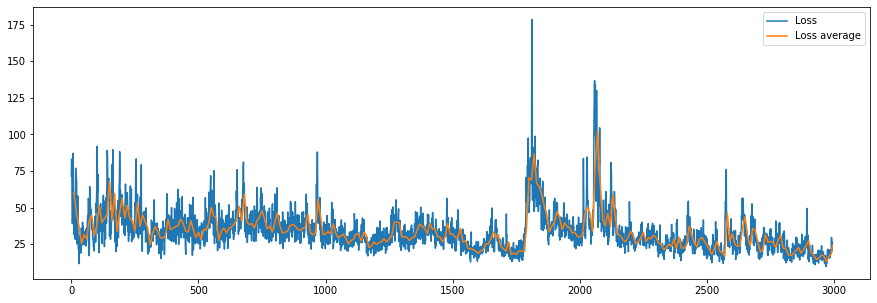

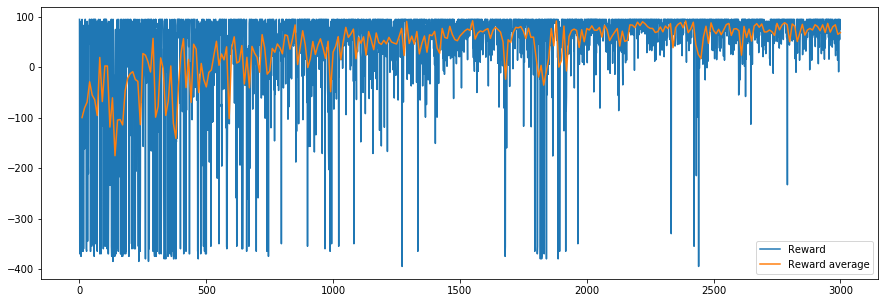

In [58]:
display_metrics(dqn_agent.hist_loss, "Loss")
display_metrics(dqn_agent.hist_reward, "Reward")

Training a DQN with **fixed Q-targets** and **Double DQN** for 3000 epochs, with batch_size 256:

We use a **Target network** with the exact same architecture than the DQN network and the same initial weights. Every 64 episodes, we copy the weights of the DQN network to update the Target Network. We use the DQN network for choosing the actions we perform. At each learning step, we use the Target network to estimate the error of the agent (Q-targets and Q-values of the next state).

This allow us to have a fixed target to aim for, and therefore the training should be less noisy.

Starting training from epoch 0,
                  for 3000 episodes,
                  updating DQN to target network every 64 epochs,
                  with batch size 256.
Not enough experience stored, returning only 7 experiences.
Not enough samples to train, returning.
Ep #1 Result: 75.0
Not enough experience stored, returning only 10 experiences.
Not enough samples to train, returning.
Ep #2 Result: 91.0
Not enough experience stored, returning only 32 experiences.
Not enough samples to train, returning.
Ep #3 Result: -5.0
Not enough experience stored, returning only 37 experiences.
Not enough samples to train, returning.
Ep #4 Result: 83.0
Not enough experience stored, returning only 40 experiences.
Not enough samples to train, returning.
Ep #5 Result: 91.0
Not enough experience stored, returning only 43 experiences.
Not enough samples to train, returning.
Ep #6 Result: 91.0
Not enough experience stored, returning only 118 experiences.
Not enough samples to train, returning.
Ep #7

Ep #313 Result: -380.0
Ep #314 Result: 95.0
Ep #315 Result: -87.0
Ep #316 Result: 87.0
Ep #317 Result: 45.0
Ep #318 Result: -34.0
Ep #319 Result: -68.0

Updating DQN to target network.

Ep #320 Result: 87.0
Ep #321 Result: 71.0
Ep #322 Result: 95.0
Ep #323 Result: 95.0
Ep #324 Result: -380.0
Ep #325 Result: -375.0
Ep #326 Result: 87.0
Ep #327 Result: 87.0
Ep #328 Result: -38.0
Ep #329 Result: 91.0
Ep #330 Result: 95.0
Ep #331 Result: -360.0
Ep #332 Result: -51.0
Ep #333 Result: -71.0
Ep #334 Result: 24.0
Ep #335 Result: -59.0
Ep #336 Result: -365.0
Ep #337 Result: 83.0
Ep #338 Result: -385.0
Ep #339 Result: 22.0
Ep #340 Result: -375.0
Ep #341 Result: -74.0
Ep #342 Result: -370.0
Ep #343 Result: -16.0
Ep #344 Result: -375.0
Ep #345 Result: 4.0
Ep #346 Result: 46.0
Ep #347 Result: -4.0
Ep #348 Result: 83.0
Ep #349 Result: -45.0
Ep #350 Result: -365.0
Ep #351 Result: -380.0
Ep #352 Result: 64.0
Ep #353 Result: -355.0
Ep #354 Result: 95.0
Ep #355 Result: -75.0
Ep #356 Result: 87.0
Ep #357 

Ep #684 Result: -370.0
Ep #685 Result: -355.0
Ep #686 Result: -3.0
Ep #687 Result: 79.0
Ep #688 Result: 95.0
Ep #689 Result: -120.0
Ep #690 Result: -365.0
Ep #691 Result: 71.0
Ep #692 Result: 22.0
Ep #693 Result: 95.0
Ep #694 Result: 91.0
Ep #695 Result: 91.0
Ep #696 Result: 95.0
Ep #697 Result: 83.0
Ep #698 Result: -35.0
Ep #699 Result: 95.0
Ep #700 Result: 72.0
Ep #701 Result: 66.0
Ep #702 Result: -114.0
Ep #703 Result: 95.0

Updating DQN to target network.

Ep #704 Result: 95.0
Ep #705 Result: 60.0
Ep #706 Result: -181.0
Ep #707 Result: 91.0
Ep #708 Result: 95.0
Ep #709 Result: 95.0
Ep #710 Result: -365.0
Ep #711 Result: 54.0
Ep #712 Result: 95.0
Ep #713 Result: 95.0
Ep #714 Result: 66.0
Ep #715 Result: 58.0
Ep #716 Result: 95.0
Ep #717 Result: 95.0
Ep #718 Result: -67.0
Ep #719 Result: -360.0
Ep #720 Result: 30.0
Ep #721 Result: 55.0
Ep #722 Result: 72.0
Ep #723 Result: 59.0
Ep #724 Result: 91.0
Ep #725 Result: 95.0
Ep #726 Result: -365.0
Ep #727 Result: -113.0
Ep #728 Result: -370

Ep #1055 Result: 91.0
Ep #1056 Result: 95.0
Ep #1057 Result: -36.0
Ep #1058 Result: -168.0
Ep #1059 Result: 91.0
Ep #1060 Result: 95.0
Ep #1061 Result: 95.0
Ep #1062 Result: 79.0
Ep #1063 Result: 72.0
Ep #1064 Result: 95.0
Ep #1065 Result: 79.0
Ep #1066 Result: 72.0
Ep #1067 Result: 95.0
Ep #1068 Result: 95.0
Ep #1069 Result: 95.0
Ep #1070 Result: -4.0
Ep #1071 Result: -20.0
Ep #1072 Result: 79.0
Ep #1073 Result: 95.0
Ep #1074 Result: 95.0
Ep #1075 Result: 95.0
Ep #1076 Result: -261.0
Ep #1077 Result: 29.0
Ep #1078 Result: -8.0
Ep #1079 Result: 87.0
Ep #1080 Result: 95.0
Ep #1081 Result: -70.0
Ep #1082 Result: 55.0
Ep #1083 Result: -29.0
Ep #1084 Result: 95.0
Ep #1085 Result: 79.0
Ep #1086 Result: 79.0
Ep #1087 Result: 83.0

Updating DQN to target network.

Ep #1088 Result: -12.0
Ep #1089 Result: -103.0
Ep #1090 Result: 75.0
Ep #1091 Result: 95.0
Ep #1092 Result: 75.0
Ep #1093 Result: 75.0
Ep #1094 Result: -345.0
Ep #1095 Result: 57.0
Ep #1096 Result: 68.0
Ep #1097 Result: 87.0
Ep #109

Ep #1414 Result: 44.0
Ep #1415 Result: 95.0
Ep #1416 Result: 95.0
Ep #1417 Result: 95.0
Ep #1418 Result: 40.0
Ep #1419 Result: -164.0
Ep #1420 Result: 0.0
Ep #1421 Result: 95.0
Ep #1422 Result: 95.0
Ep #1423 Result: 95.0
Ep #1424 Result: 87.0
Ep #1425 Result: 95.0
Ep #1426 Result: 95.0
Ep #1427 Result: 91.0
Ep #1428 Result: 83.0
Ep #1429 Result: 95.0
Ep #1430 Result: -150.0
Ep #1431 Result: 95.0
Ep #1432 Result: 95.0
Ep #1433 Result: 95.0
Ep #1434 Result: 95.0
Ep #1435 Result: 91.0
Ep #1436 Result: 48.0
Ep #1437 Result: -25.0
Ep #1438 Result: -87.0
Ep #1439 Result: 87.0
Ep #1440 Result: -340.0
Ep #1441 Result: 95.0
Ep #1442 Result: -350.0
Ep #1443 Result: -355.0
Ep #1444 Result: 91.0
Ep #1445 Result: 79.0
Ep #1446 Result: -182.0
Ep #1447 Result: 91.0
Ep #1448 Result: -365.0
Ep #1449 Result: 95.0
Ep #1450 Result: 79.0
Ep #1451 Result: 95.0
Ep #1452 Result: 59.0
Ep #1453 Result: 8.0
Ep #1454 Result: 64.0
Ep #1455 Result: 63.0
Ep #1456 Result: 95.0
Ep #1457 Result: 79.0
Ep #1458 Result: 9

Ep #1775 Result: 75.0
Ep #1776 Result: 71.0
Ep #1777 Result: 49.0
Ep #1778 Result: 75.0
Ep #1779 Result: 59.0
Ep #1780 Result: 87.0
Ep #1781 Result: -46.0
Ep #1782 Result: 43.0
Ep #1783 Result: 91.0
Ep #1784 Result: 95.0
Ep #1785 Result: 67.0
Ep #1786 Result: 60.0
Ep #1787 Result: 71.0
Ep #1788 Result: 95.0
Ep #1789 Result: 64.0
Ep #1790 Result: 95.0
Ep #1791 Result: 95.0

Updating DQN to target network.

Ep #1792 Result: 52.0
Ep #1793 Result: 71.0
Ep #1794 Result: 43.0
Ep #1795 Result: 95.0
Ep #1796 Result: 44.0
Ep #1797 Result: 66.0
Ep #1798 Result: 91.0
Ep #1799 Result: -4.0
Ep #1800 Result: 72.0
Ep #1801 Result: 95.0
Ep #1802 Result: 31.0
Ep #1803 Result: 95.0
Ep #1804 Result: 95.0
Ep #1805 Result: 51.0
Ep #1806 Result: 68.0
Ep #1807 Result: 28.0
Ep #1808 Result: 51.0
Ep #1809 Result: 95.0
Ep #1810 Result: 68.0
Ep #1811 Result: -340.0
Ep #1812 Result: 54.0
Ep #1813 Result: -16.0
Ep #1814 Result: 75.0
Ep #1815 Result: 64.0
Ep #1816 Result: 83.0
Ep #1817 Result: 66.0
Ep #1818 Result:

Ep #2497 Result: 95.0
Ep #2498 Result: -148.0
Ep #2499 Result: 95.0
Ep #2500 Result: 91.0
Ep #2501 Result: 95.0
Ep #2502 Result: 91.0
Ep #2503 Result: 44.0
Ep #2504 Result: 95.0
Ep #2505 Result: 83.0
Ep #2506 Result: 95.0
Ep #2507 Result: 91.0
Ep #2508 Result: 95.0
Ep #2509 Result: 67.0
Ep #2510 Result: 42.0
Ep #2511 Result: 95.0
Ep #2512 Result: 10.0
Ep #2513 Result: 95.0
Ep #2514 Result: 87.0
Ep #2515 Result: 95.0
Ep #2516 Result: 91.0
Ep #2517 Result: -169.0
Ep #2518 Result: 95.0
Ep #2519 Result: 95.0
Ep #2520 Result: 68.0
Ep #2521 Result: 95.0
Ep #2522 Result: 95.0
Ep #2523 Result: 95.0
Ep #2524 Result: 91.0
Ep #2525 Result: 52.0
Ep #2526 Result: 68.0
Ep #2527 Result: 95.0
Ep #2528 Result: 43.0
Ep #2529 Result: 95.0
Ep #2530 Result: 91.0
Ep #2531 Result: 68.0
Ep #2532 Result: 79.0
Ep #2533 Result: 95.0
Ep #2534 Result: 91.0
Ep #2535 Result: 75.0
Ep #2536 Result: -64.0
Ep #2537 Result: 91.0
Ep #2538 Result: 79.0
Ep #2539 Result: 95.0
Ep #2540 Result: 91.0
Ep #2541 Result: 95.0
Ep #2

Ep #2862 Result: 66.0
Ep #2863 Result: 95.0
Ep #2864 Result: 87.0
Ep #2865 Result: 87.0
Ep #2866 Result: 64.0
Ep #2867 Result: 87.0
Ep #2868 Result: 58.0
Ep #2869 Result: 63.0
Ep #2870 Result: 95.0
Ep #2871 Result: 71.0
Ep #2872 Result: 95.0
Ep #2873 Result: 95.0
Ep #2874 Result: 56.0
Ep #2875 Result: 95.0
Ep #2876 Result: 95.0
Ep #2877 Result: 95.0
Ep #2878 Result: 95.0
Ep #2879 Result: 95.0

Updating DQN to target network.

Ep #2880 Result: 91.0
Ep #2881 Result: 95.0
Ep #2882 Result: 91.0
Ep #2883 Result: 91.0
Ep #2884 Result: 95.0
Ep #2885 Result: 71.0
Ep #2886 Result: 95.0
Ep #2887 Result: 51.0
Ep #2888 Result: 45.0
Ep #2889 Result: 95.0
Ep #2890 Result: 87.0
Ep #2891 Result: 91.0
Ep #2892 Result: 48.0
Ep #2893 Result: 60.0
Ep #2894 Result: 95.0
Ep #2895 Result: 55.0
Ep #2896 Result: 51.0
Ep #2897 Result: 95.0
Ep #2898 Result: 91.0
Ep #2899 Result: 95.0
Ep #2900 Result: 91.0
Ep #2901 Result: 95.0
Ep #2902 Result: 32.0
Ep #2903 Result: 75.0
Ep #2904 Result: 91.0
Ep #2905 Result: 95.

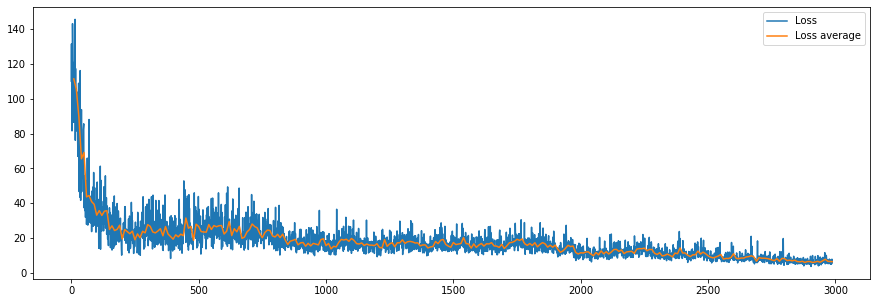

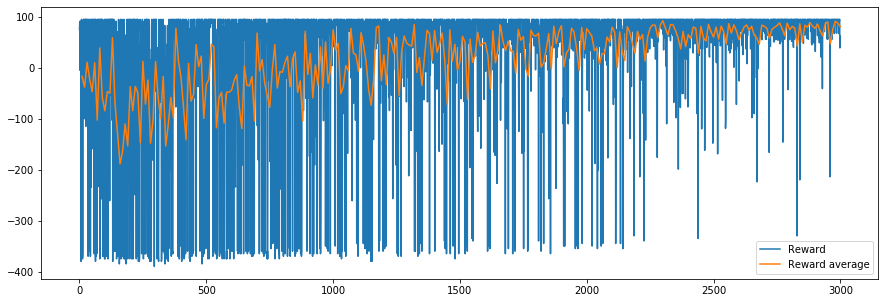

In [59]:
double_dqn_agent = DoomDQNAgent(target_update=64)
double_dqn_agent.run_train(nb_epoch=3000)

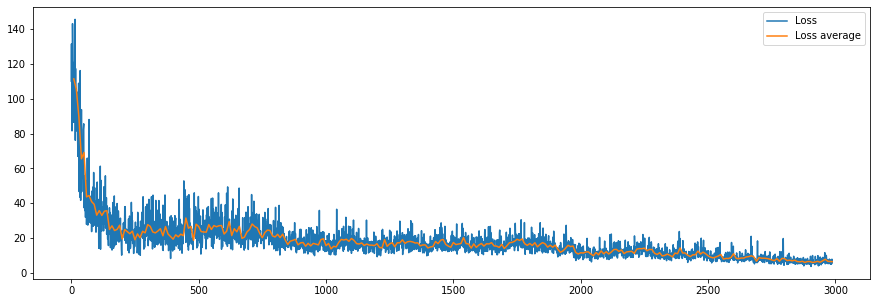

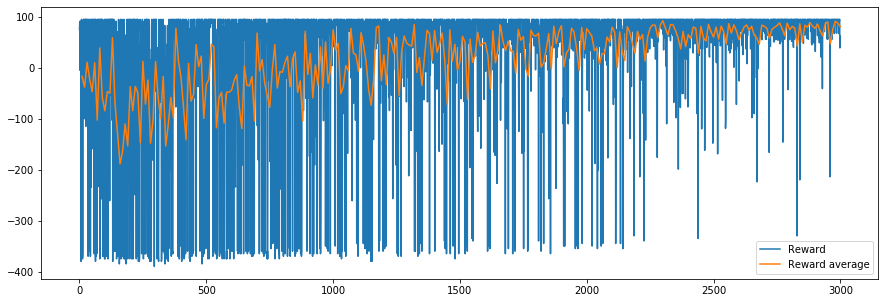

In [60]:
display_metrics(double_dqn_agent.hist_loss, "Loss")
display_metrics(double_dqn_agent.hist_reward, "Reward")

### Dueling DQN

To improve the training phase, we implement a Dueling DQN. We separate the estimation of the Q-action value into two estimations:
- the **value V(s)**,
- the **Advantage for each action A(s, a)**.

We can then recover the Q-action value function as: **Q(s, a) = V(s) + A(s, a)**.

Therefore, we need to modify the DQN to have two estimators:

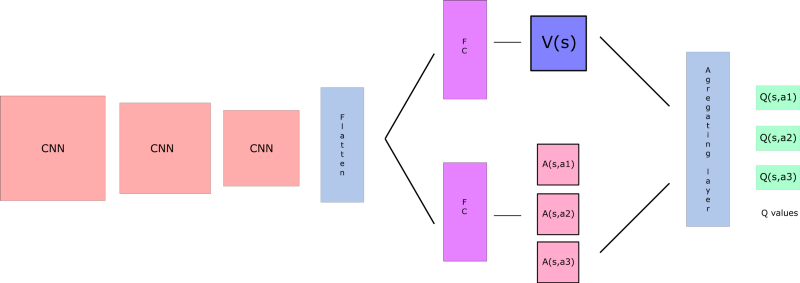

In [63]:
Image(filename="img/dueling_dqn.png")

To aggragate the two estimations, we use this simple formula:

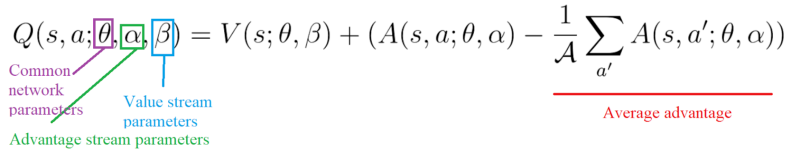

In [2]:
Image(filename="img/dueling_aggreg_formula.png")

In [52]:
class DuelingDQNetwork(nn.Module):

    def __init__(self):
        super(DuelingDQNetwork, self).__init__()
        """
            First Convolutional layer:
            Conv2d: Output Width = [(Input width - Kernel width + 2 * Padding) / Stride] + 1
                => [(84 - 8 + 0) / 2] + 1 = 39 => 39 x 39 x 32
            BatchNormalization
        """
        self.conv1 = nn.Conv2d(in_channels=4, out_channels=32, kernel_size=8, stride=2)
        self.batchnorm1 = nn.BatchNorm2d(num_features=32)

        """
            Second Convolutional layer:
            Conv2d: Output => [(38 - 4 + 0) / 2] + 1 = 18 => 18 x 18 x 64
            BatchNormalization
        """
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2)
        self.batchnorm2 = nn.BatchNorm2d(num_features=64)

        """
            Third Convolutional layer:
            Conv2d: Output => [(18 - 4 + 0) / 2] + 1 = 8 => 8 x 8 x 128
            BatchNormalization
        """
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2)
        self.batchnorm3 = nn.BatchNorm2d(num_features=128)

        """
            Value Estimator:
            Two Fully Connected layers with one output (value of the state):
            Input size = 8 x 8 x 128 = 8192
        """
        self.v_fc = nn.Linear(in_features=8192, out_features=512)
        self.v_out = nn.Linear(in_features=512, out_features=1)

        """
            Advantage Estimator:
            Two Fully Connected layers with three outputs (advantage of each action):
            Input size = 8 x 8 x 128 = 8192
        """
        self.a_fc = nn.Linear(in_features=8192, out_features=512)
        self.a_out = nn.Linear(in_features=512, out_features=3)

    def forward(self, x):
        # First Convolutional layer with ELU activation
        x = F.elu(self.batchnorm1(self.conv1(x)))

        # Second Convolutional layer with ELU activation
        x = F.elu(self.batchnorm2(self.conv2(x)))

        # Third Convolutional layer with ELU activation
        x = F.elu(self.batchnorm3(self.conv3(x)))

        # Flatten the output of the convolution
        x = x.view(-1, 8192)

        # Value estimation
        x_v_out = F.elu(self.v_fc(x))
        x_v_out = self.v_out(x_v_out)

        # Advantage estimation
        x_a_out = F.elu(self.a_fc(x))
        x_a_out = self.a_out(x_a_out)
        
        # Aggregation
        q_out = x_v_out + (x_a_out - torch.mean(x_a_out, dim=1, keepdim=True))

        # Output
        return q_out

Training a **Dueling Double DQN** for 3000 episodes, with batch_size = 256:

In [53]:
dueling_ddqn = DoomDQNAgent(dqn_class=DuelingDQNetwork)
dueling_ddqn.run_train(nb_epoch=3000)

Starting training from epoch 0,
                  for 3000 episodes,
                  updating DQN to target network every 64 epochs,
                  with batch size 256.
Not enough experience stored, returning only 4 experiences.
Not enough samples to train, returning.
Ep #1 Result: 87.0
Not enough experience stored, returning only 9 experiences.
Not enough samples to train, returning.
Ep #2 Result: 76.0
Not enough experience stored, returning only 12 experiences.
Not enough samples to train, returning.
Ep #3 Result: 91.0
Not enough experience stored, returning only 14 experiences.
Not enough samples to train, returning.
Ep #4 Result: 95.0
Not enough experience stored, returning only 17 experiences.
Not enough samples to train, returning.
Ep #5 Result: 91.0
Not enough experience stored, returning only 23 experiences.
Not enough samples to train, returning.
Ep #6 Result: 79.0
Not enough experience stored, returning only 82 experiences.
Not enough samples to train, returning.
Ep #7 R

Ep #319 Result: -159.0

Updating DQN to target network.

Ep #320 Result: -6.0
Ep #321 Result: 91.0
Ep #322 Result: -365.0
Ep #323 Result: -163.0
Ep #324 Result: 64.0
Ep #325 Result: -360.0
Ep #326 Result: -380.0
Ep #327 Result: 91.0
Ep #328 Result: -365.0
Ep #329 Result: -365.0
Ep #330 Result: 75.0
Ep #331 Result: 95.0
Ep #332 Result: -128.0
Ep #333 Result: 63.0
Ep #334 Result: -375.0
Ep #335 Result: -355.0
Ep #336 Result: 11.0
Ep #337 Result: -380.0
Ep #338 Result: 63.0
Ep #339 Result: -71.0
Ep #340 Result: 95.0
Ep #341 Result: 83.0
Ep #342 Result: -365.0
Ep #343 Result: 95.0
Ep #344 Result: -360.0
Ep #345 Result: 95.0
Ep #346 Result: 62.0
Ep #347 Result: 87.0
Ep #348 Result: 71.0
Ep #349 Result: 52.0
Ep #350 Result: 0.0
Ep #351 Result: 45.0
Ep #352 Result: 83.0
Ep #353 Result: 91.0
Ep #354 Result: 52.0
Ep #355 Result: 95.0
Ep #356 Result: 91.0
Ep #357 Result: -360.0
Ep #358 Result: 6.0
Ep #359 Result: 71.0
Ep #360 Result: 72.0
Ep #361 Result: 87.0
Ep #362 Result: 83.0
Ep #363 Result:

Ep #689 Result: 75.0
Ep #690 Result: -8.0
Ep #691 Result: -370.0
Ep #692 Result: -355.0
Ep #693 Result: 91.0
Ep #694 Result: -30.0
Ep #695 Result: 87.0
Ep #696 Result: 24.0
Ep #697 Result: 83.0
Ep #698 Result: -29.0
Ep #699 Result: 95.0
Ep #700 Result: 91.0
Ep #701 Result: -345.0
Ep #702 Result: -365.0
Ep #703 Result: 95.0

Updating DQN to target network.

Ep #704 Result: 68.0
Ep #705 Result: -106.0
Ep #706 Result: -355.0
Ep #707 Result: 91.0
Ep #708 Result: 95.0
Ep #709 Result: -66.0
Ep #710 Result: 95.0
Ep #711 Result: -198.0
Ep #712 Result: 5.0
Ep #713 Result: -102.0
Ep #714 Result: 95.0
Ep #715 Result: 95.0
Ep #716 Result: 95.0
Ep #717 Result: 95.0
Ep #718 Result: 95.0
Ep #719 Result: 95.0
Ep #720 Result: 95.0
Ep #721 Result: 83.0
Ep #722 Result: 95.0
Ep #723 Result: 95.0
Ep #724 Result: -272.0
Ep #725 Result: 24.0
Ep #726 Result: 91.0
Ep #727 Result: -370.0
Ep #728 Result: -365.0
Ep #729 Result: 95.0
Ep #730 Result: -17.0
Ep #731 Result: -365.0
Ep #732 Result: 95.0
Ep #733 Result:

Ep #1058 Result: 87.0
Ep #1059 Result: 95.0
Ep #1060 Result: 95.0
Ep #1061 Result: -350.0
Ep #1062 Result: -360.0
Ep #1063 Result: 95.0
Ep #1064 Result: 95.0
Ep #1065 Result: 58.0
Ep #1066 Result: 95.0
Ep #1067 Result: -4.0
Ep #1068 Result: 76.0
Ep #1069 Result: -355.0
Ep #1070 Result: 95.0
Ep #1071 Result: -365.0
Ep #1072 Result: 34.0
Ep #1073 Result: 67.0
Ep #1074 Result: -340.0
Ep #1075 Result: -45.0
Ep #1076 Result: 91.0
Ep #1077 Result: 95.0
Ep #1078 Result: 95.0
Ep #1079 Result: -345.0
Ep #1080 Result: 53.0
Ep #1081 Result: -370.0
Ep #1082 Result: 50.0
Ep #1083 Result: 95.0
Ep #1084 Result: 14.0
Ep #1085 Result: 51.0
Ep #1086 Result: 95.0
Ep #1087 Result: -41.0

Updating DQN to target network.

Ep #1088 Result: 26.0
Ep #1089 Result: 71.0
Ep #1090 Result: 95.0
Ep #1091 Result: 91.0
Ep #1092 Result: -350.0
Ep #1093 Result: 95.0
Ep #1094 Result: 95.0
Ep #1095 Result: 83.0
Ep #1096 Result: 46.0
Ep #1097 Result: 91.0
Ep #1098 Result: 62.0
Ep #1099 Result: 95.0
Ep #1100 Result: 95.0
Ep

Ep #1416 Result: 91.0
Ep #1417 Result: 66.0
Ep #1418 Result: 63.0
Ep #1419 Result: 95.0
Ep #1420 Result: 95.0
Ep #1421 Result: 95.0
Ep #1422 Result: 91.0
Ep #1423 Result: 83.0
Ep #1424 Result: -355.0
Ep #1425 Result: 6.0
Ep #1426 Result: -14.0
Ep #1427 Result: 46.0
Ep #1428 Result: 83.0
Ep #1429 Result: 95.0
Ep #1430 Result: 83.0
Ep #1431 Result: 95.0
Ep #1432 Result: 79.0
Ep #1433 Result: 58.0
Ep #1434 Result: 95.0
Ep #1435 Result: -8.0
Ep #1436 Result: 79.0
Ep #1437 Result: 58.0
Ep #1438 Result: 54.0
Ep #1439 Result: 71.0
Ep #1440 Result: 91.0
Ep #1441 Result: 91.0
Ep #1442 Result: 79.0
Ep #1443 Result: 63.0
Ep #1444 Result: 95.0
Ep #1445 Result: 95.0
Ep #1446 Result: 64.0
Ep #1447 Result: 83.0
Ep #1448 Result: -355.0
Ep #1449 Result: 95.0
Ep #1450 Result: 62.0
Ep #1451 Result: -4.0
Ep #1452 Result: 95.0
Ep #1453 Result: 5.0
Ep #1454 Result: 7.0
Ep #1455 Result: 75.0
Ep #1456 Result: 95.0
Ep #1457 Result: 42.0
Ep #1458 Result: 95.0
Ep #1459 Result: 19.0
Ep #1460 Result: 75.0
Ep #1461

Ep #1778 Result: 95.0
Ep #1779 Result: 95.0
Ep #1780 Result: 87.0
Ep #1781 Result: 83.0
Ep #1782 Result: -155.0
Ep #1783 Result: 95.0
Ep #1784 Result: 95.0
Ep #1785 Result: 68.0
Ep #1786 Result: 33.0
Ep #1787 Result: 66.0
Ep #1788 Result: 91.0
Ep #1789 Result: 47.0
Ep #1790 Result: -29.0
Ep #1791 Result: -375.0

Updating DQN to target network.

Ep #1792 Result: 95.0
Ep #1793 Result: 37.0
Ep #1794 Result: -132.0
Ep #1795 Result: 31.0
Ep #1796 Result: -350.0
Ep #1797 Result: 95.0
Ep #1798 Result: 95.0
Ep #1799 Result: 95.0
Ep #1800 Result: 42.0
Ep #1801 Result: 91.0
Ep #1802 Result: 25.0
Ep #1803 Result: 95.0
Ep #1804 Result: 79.0
Ep #1805 Result: 95.0
Ep #1806 Result: -198.0
Ep #1807 Result: 95.0
Ep #1808 Result: 91.0
Ep #1809 Result: 46.0
Ep #1810 Result: 42.0
Ep #1811 Result: 64.0
Ep #1812 Result: 95.0
Ep #1813 Result: 60.0
Ep #1814 Result: 83.0
Ep #1815 Result: 79.0
Ep #1816 Result: 95.0
Ep #1817 Result: 59.0
Ep #1818 Result: 95.0
Ep #1819 Result: 95.0
Ep #1820 Result: 70.0
Ep #1821 

Ep #2139 Result: -20.0
Ep #2140 Result: 95.0
Ep #2141 Result: 19.0
Ep #2142 Result: 34.0
Ep #2143 Result: 95.0
Ep #2144 Result: 63.0
Ep #2145 Result: 95.0
Ep #2146 Result: 95.0
Ep #2147 Result: 87.0
Ep #2148 Result: 67.0
Ep #2149 Result: 87.0
Ep #2150 Result: 95.0
Ep #2151 Result: -18.0
Ep #2152 Result: 56.0
Ep #2153 Result: 67.0
Ep #2154 Result: 95.0
Ep #2155 Result: 95.0
Ep #2156 Result: 59.0
Ep #2157 Result: 95.0
Ep #2158 Result: 83.0
Ep #2159 Result: 71.0
Ep #2160 Result: 83.0
Ep #2161 Result: -350.0
Ep #2162 Result: 42.0
Ep #2163 Result: 91.0
Ep #2164 Result: 95.0
Ep #2165 Result: 95.0
Ep #2166 Result: 83.0
Ep #2167 Result: 95.0
Ep #2168 Result: 95.0
Ep #2169 Result: 39.0
Ep #2170 Result: 79.0
Ep #2171 Result: 71.0
Ep #2172 Result: 91.0
Ep #2173 Result: 95.0
Ep #2174 Result: 43.0
Ep #2175 Result: 95.0

Updating DQN to target network.

Ep #2176 Result: 95.0
Ep #2177 Result: 95.0
Ep #2178 Result: 95.0
Ep #2179 Result: 95.0
Ep #2180 Result: 95.0
Ep #2181 Result: 95.0
Ep #2182 Result:

Ep #2501 Result: 95.0
Ep #2502 Result: 95.0
Ep #2503 Result: 95.0
Ep #2504 Result: 71.0
Ep #2505 Result: 75.0
Ep #2506 Result: 95.0
Ep #2507 Result: 71.0
Ep #2508 Result: 95.0
Ep #2509 Result: 83.0
Ep #2510 Result: 95.0
Ep #2511 Result: 64.0
Ep #2512 Result: 95.0
Ep #2513 Result: 95.0
Ep #2514 Result: 83.0
Ep #2515 Result: 95.0
Ep #2516 Result: -29.0
Ep #2517 Result: 79.0
Ep #2518 Result: 56.0
Ep #2519 Result: 60.0
Ep #2520 Result: 95.0
Ep #2521 Result: 95.0
Ep #2522 Result: 87.0
Ep #2523 Result: 64.0
Ep #2524 Result: 41.0
Ep #2525 Result: -7.0
Ep #2526 Result: 95.0
Ep #2527 Result: 43.0
Ep #2528 Result: 60.0
Ep #2529 Result: 75.0
Ep #2530 Result: 95.0
Ep #2531 Result: 95.0
Ep #2532 Result: 91.0
Ep #2533 Result: 64.0
Ep #2534 Result: 95.0
Ep #2535 Result: 95.0
Ep #2536 Result: 95.0
Ep #2537 Result: 95.0
Ep #2538 Result: 79.0
Ep #2539 Result: 87.0
Ep #2540 Result: 95.0
Ep #2541 Result: -182.0
Ep #2542 Result: 95.0
Ep #2543 Result: 87.0
Ep #2544 Result: 95.0
Ep #2545 Result: 67.0
Ep #254

Ep #2865 Result: 95.0
Ep #2866 Result: 95.0
Ep #2867 Result: 83.0
Ep #2868 Result: 95.0
Ep #2869 Result: 79.0
Ep #2870 Result: 83.0
Ep #2871 Result: 79.0
Ep #2872 Result: 56.0
Ep #2873 Result: 67.0
Ep #2874 Result: 95.0
Ep #2875 Result: 71.0
Ep #2876 Result: 95.0
Ep #2877 Result: 67.0
Ep #2878 Result: 95.0
Ep #2879 Result: 39.0

Updating DQN to target network.

Ep #2880 Result: 95.0
Ep #2881 Result: 95.0
Ep #2882 Result: 95.0
Ep #2883 Result: 95.0
Ep #2884 Result: 35.0
Ep #2885 Result: 63.0
Ep #2886 Result: -345.0
Ep #2887 Result: 95.0
Ep #2888 Result: 95.0
Ep #2889 Result: 75.0
Ep #2890 Result: 95.0
Ep #2891 Result: 95.0
Ep #2892 Result: 79.0
Ep #2893 Result: 95.0
Ep #2894 Result: 79.0
Ep #2895 Result: 95.0
Ep #2896 Result: 91.0
Ep #2897 Result: 50.0
Ep #2898 Result: 91.0
Ep #2899 Result: 56.0
Ep #2900 Result: 91.0
Ep #2901 Result: 75.0
Ep #2902 Result: 95.0
Ep #2903 Result: 95.0
Ep #2904 Result: 95.0
Ep #2905 Result: 95.0
Ep #2906 Result: 67.0
Ep #2907 Result: 95.0
Ep #2908 Result: 9

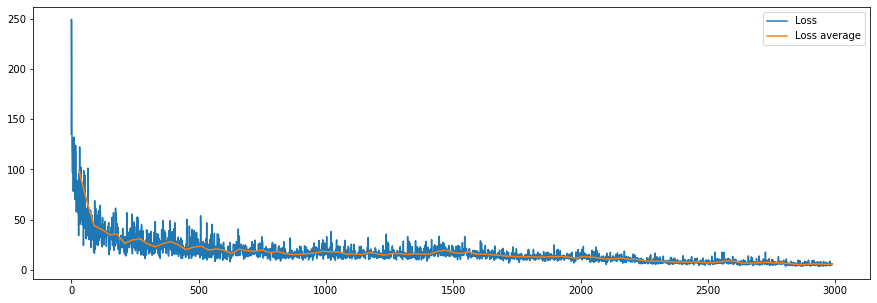

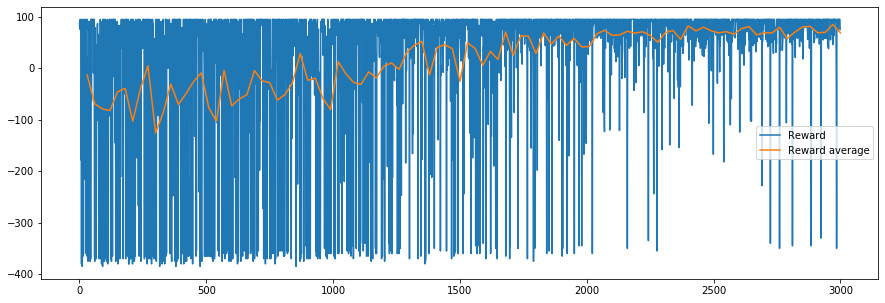

In [57]:
display_metrics(dueling_ddqn.hist_loss, "Loss")
display_metrics(dueling_ddqn.hist_reward, "Reward")

Dueling doesn't seem to improve the training. It may be that our task is too simple: there are too less actions to gain a lot from Dueling. We are then just making the model more complexe, and the training is therefore more noisy.

### Prioritized Experience Replay

For now, with our simple Replay Memory, we sample uniformly from all the saved experiences. However, [Tom Schaul et al. (2015)](https://arxiv.org/abs/1511.05952) argue that **some experiences are more important than others** because they show a big difference between the current strategy and the optimal one. As these experiences occur rarely, we also sample them rarely and therefore the agent doesn't learn a lot from them. 

With **Prioritized Experience Replay**, we want to sample experiences using a distribution defined by the priority of each experience. That way, experiences that we identify as more important for training have more chance to be used for training. 

Basically, the priority of an experience is defined by the absolute difference between our prediction of the TD Target and its real value: the **TD Error**. 

In order to be able to sample experiences efficiently following this distribution, we need to change the data structure of the Replay Memory: we'll use an [**unsorted SumTree**](https://www.fcodelabs.com/2019/03/18/Sum-Tree-Introduction/). This data structure allows to find a particular node with complexity of **O(log(n))**, compared to the far worse O(n) if we wanted to simply sort the experiences by priority.

In [163]:
class SumTree:
    
    def __init__(self, capacity):
        self.capacity = capacity
        
        # Tree
        self.tree = np.zeros(2 * capacity - 1)
        
        # Data
        self.data = np.zeros(capacity, dtype=object)
        self.data_id = 0
        
    def insert(self, experience):
        # Get tree index
        tree_id = self.capacity - 1 + self.data_id
        
        # Add experience to data
        self.data[self.data_id] = experience
        self.data_id += 1
        if self.data_id >= self.capacity:
            self.data_id = 0
            
        # Add priority to tree
        priority = experience[-1]
        self.tree[tree_id] = priority
        parent = tree_id
        while parent > 0:
            # If current node is even, parent(n) = (n - 2) / 2
            if parent % 2 == 0:
                parent = int((parent - 2) / 2)
            # If current node is odd, parent(n) = (n - 1) / 2
            else:
                parent = int((parent - 1) / 2)
            
            # Add left and right nodes
            left = self.tree[(2 * parent) + 1]
            right = self.tree[(2 * parent) + 2]
            self.tree[parent] = left + right
               
    def sample(self, v, node_id=0):
        # If node is leaf
        if node_id >= self.capacity - 1:
            # Return corresponding experience
            sample_id = node_id - (self.capacity - 1)
            return self.data[sample_id]
        
        # Get child nodes id
        left_id = (2 * node_id) + 1
        right_id = (2 * node_id) + 2
        # If v inferior to left_node_value, go to left node
        if v < self.tree[left_id]:
            return self.sample(v, left_id)
        # Else, go to right node and change v to (v - left_node_value)
        else:
            return self.sample(v - self.tree[left_id], right_id)
        
    def sample_k(self, k):
        experiences = []
        # Get range for sampling
        k_range = self.tree[0] / k
        # Sample k experiences in ranges
        for i in range(k):
            r = random.uniform(i * k_range, (i + 1) * k_range)
            experiences.append(self.sample(r))
        return experiences